In [79]:
import torch
import torchvision
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
import torch.nn as nn
import torch.nn.functional as F
from torchvision.datasets import MNIST
from torchvision.transforms import ToTensor
from torchvision.utils import make_grid
from torch.utils.data.dataloader import DataLoader
from torch.utils.data import random_split
import pickle
import os
from scipy import stats

import plotly.express as px

import math
import random
import pandas as pd



def countDiffMasks(mask1,mask2):
    total_diff=0
    for i in range(len(mask1)):
        m_1=mask1[i].flatten()
        m_2=mask2[i].flatten()
        count_same=(m_1 == m_2).sum()
        count_different=m_1.flatten().shape[0]-count_same
        total_diff+=count_different
    return total_diff


def get_mask_compression(mask_whole_model):
    num_total=0
    num_non_zeros=0
    for mask_each_layer in mask_whole_model:
        num_total+=torch.numel(mask_each_layer)
        num_non_zeros+=torch.count_nonzero(mask_each_layer)
        
    return (num_total-num_non_zeros)/num_total

    
    

def prune_model_get_mask(model,prune_rate):
    '''
    works purely on the model to get
    mask
    '''
    mask_whole_model=[]
    for nm, params in model.named_parameters():
        if "weight" in nm and "bn" not in nm and "linear" not in nm:
            mask_layer=torch.ones(params.shape)
#             print(nm,params.shape)
            abs_var=torch.std(torch.abs(params.data))
#             print(abs_var)
#             print(params)
            threshold=abs_var*prune_rate
            num_components=params.shape[0]
            for index_component in range(num_components):
                values=params[index_component]            
                re_shaped_values=values.flatten()                
                mask_vals = (torch.abs(re_shaped_values)>threshold).float()
                mask_vals=mask_vals.reshape(values.shape)
#                 print(mask_vals.shape)
                mask_layer[index_component]=mask_vals
            mask_whole_model.append(mask_layer)
    return mask_whole_model
 
    
def get_thresholds_each_layer(model,prune_rate):
    thresholds_per_layer=[]
    for nm, params in model.named_parameters():
        if "weight" in nm and "bn" not in nm and "linear" not in nm:
            mask_layer=torch.ones(params.shape)
            abs_std=torch.std(torch.abs(params.data))
            threshold=abs_std*prune_rate
            thresholds_per_layer.append(threshold)
    return thresholds_per_layer
    
                
def apply_mask_model(model,list_mask_whole_model):
    mask_layer_count=0
    for nm, params in model.named_parameters():
        if "weight" in nm and "bn" not in nm and "linear" not in nm:
            mask_layer=list_mask_whole_model[mask_layer_count]
            with torch.no_grad():
                device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
#                 print("Devices are ",params.device,mask_layer.device)
                mask_layer=mask_layer.to(device)
    
                params.data=params.data*mask_layer            
            mask_layer_count+=1
    

def store_weights_in_dic(weight_description,model):
    for nm, params in model.named_parameters():
        if "weight" in nm and "bn" not in nm and "linear" not in nm:
            if nm not in weight_description:
                weight_description[nm]={}
            num_components=params.shape[0]
            for index_component in range(num_components):
                if index_component not in weight_description[nm]:
                    weight_description[nm][index_component]={}
                values=params[index_component]
                flat_values=values.flatten()
                for index_wt in range(flat_values.shape[0]):
                    if index_wt not in weight_description[nm][index_component]:
                        weight_description[nm][index_component][index_wt]=[]
                    weight_description[nm][index_component][index_wt].append(flat_values[index_wt].detach().item())
    return weight_description


def get_boolean_dict_weight_dict(weight_description,prune_rate,thresholds_per_layer,last_few):
    '''
    works on the dictionary of weights
    to create a dict of 1s and 0s to show
    how many times weight is more than threshold
    per layer
    '''
    boolean_weight_description={}
    count=0
    for layer in weight_description.keys():  
#         print("Count = ",count)
        threshold_this_layer=thresholds_per_layer[count]
#         print("Threshold for layer ",count,layer,"is ",threshold_this_layer)
        if layer not in boolean_weight_description:
            boolean_weight_description[layer]={}
        for index_component in weight_description[layer].keys():
            if index_component not in boolean_weight_description[layer]:
                boolean_weight_description[layer][index_component]={}
            for index_wt in weight_description[layer][index_component].keys():
                if index_wt not in boolean_weight_description[layer][index_component]:
                    boolean_weight_description[layer][index_component][index_wt]=[]
                all_wts=weight_description[layer][index_component][index_wt][:-last_few]
                all_wts_boolean=[]
                for wt in all_wts:
                    if abs(wt)>threshold_this_layer:
                        all_wts_boolean.append(1)
                    else:
                        all_wts_boolean.append(0)
                boolean_weight_description[layer][index_component][index_wt]=all_wts_boolean                    
        count+=1
        
    return boolean_weight_description



def get_mean_dict_weight_dict(weight_description,last_few):
    '''
    works on the dictionary of weights
    to create a dict of mean of weights simply
    for the last few epochs
    '''
    mean_weight_description={}

    for layer in weight_description.keys():  
        if layer not in mean_weight_description:
            mean_weight_description[layer]={}
        for index_component in weight_description[layer].keys():
            if index_component not in mean_weight_description[layer]:
                mean_weight_description[layer][index_component]={}
            for index_wt in weight_description[layer][index_component].keys():
                if index_wt not in mean_weight_description[layer][index_component]:
                    mean_weight_description[layer][index_component][index_wt]=[]
                all_wts=weight_description[layer][index_component][index_wt][-last_few:]                
                all_wts_mean=np.mean(all_wts)                
                mean_weight_description[layer][index_component][index_wt]=all_wts_mean                    
        
    return mean_weight_description



    
# create mask from boolean weight dictionary
def create_mask_from_boolean_wt(model,boolean_wt_dict):
    mask_whole_model=[]
    for nm, params in model.named_parameters():
        if "weight" in nm and "bn" not in nm and "linear" not in nm:
            mask_layer=torch.ones(params.shape)
#             print(nm,params.shape)
            abs_var=torch.var(torch.abs(params.data))
#             print(abs_var)
#             print(params)
#             threshold=abs_var*prune_rate
            num_components=params.shape[0]
            for index_component in range(num_components):
                values=params[index_component]            
                re_shaped_values=values.flatten() 
                mask_vals=[]
                for val_index in range(re_shaped_values.shape[0]):
                    boolean_vals=boolean_wt_dict[nm][index_component][val_index]
                    m = stats.mode(boolean_vals)
#                     print("Verdict for this weight is ",m[0][0])
                    mask_vals.append(m[0][0])
#                 mask_vals = (torch.abs(re_shaped_values)>threshold).float()                
                mask_vals=np.asarray(mask_vals)
                mask_vals=mask_vals.reshape(values.shape)
#                 print(mask_vals.shape)
                mask_layer[index_component]=torch.from_numpy(mask_vals)
            mask_whole_model.append(mask_layer)
    return mask_whole_model


         
def create_mask_from_mean_wt(model,mean_weight_description,prune_rate):
    mask_whole_model=[]
    for nm, params in model.named_parameters():
        if "weight" in nm and "bn" not in nm and "linear" not in nm:
            mask_layer=torch.ones(params.shape)    
            # get all mean weights for this layer
            mean_wt_layer=mean_weight_description[nm]
            wts_this_layer=[]
            for neuron_index in list(mean_wt_layer.keys()):
                all_wts_this_neu=mean_wt_layer[neuron_index]

                for weight_index in list(mean_wt_layer[neuron_index].keys()):
                    wts_this_layer.append(mean_wt_layer[neuron_index][weight_index])
            # end of all neurons
#             print("first 5 Mean weights this layer are ",wts_this_layer[:5])
            abs_var=torch.std(torch.FloatTensor(wts_this_layer))
#             print("standard dev is ",abs_var)
            threshold=abs_var*prune_rate
#             print("Threshold is ",threshold)
            num_components=params.shape[0]            
            for index_component in range(num_components):
                values=params[index_component]            
                re_shaped_values=values.flatten()                
                mask_vals = (torch.abs(re_shaped_values)>threshold).float()
                mask_vals=mask_vals.reshape(values.shape)
#                 print(mask_vals.shape)
                mask_layer[index_component]=mask_vals
            mask_whole_model.append(mask_layer)
    return mask_whole_model
            
                
                
import math

def get_weighted_mean_dict_weight_dict(weight_description,last_few):
    '''
    works on the dictionary of weights
    to create a dict of mean of weights     
    for the last few epochs
    and gives a weightage to each weight value
    depending on the epoch
    last epoch highest weight
    '''
    weighted_mean_weight_description={}

    for layer in weight_description.keys():  
        if layer not in weighted_mean_weight_description:
            weighted_mean_weight_description[layer]={}
        for index_component in weight_description[layer].keys():
            if index_component not in weighted_mean_weight_description[layer]:
                weighted_mean_weight_description[layer][index_component]={}
            for index_wt in weight_description[layer][index_component].keys():
                if index_wt not in weighted_mean_weight_description[layer][index_component]:
                    weighted_mean_weight_description[layer][index_component][index_wt]=[]
                all_wts=weight_description[layer][index_component][index_wt][-last_few:]
                i_weights=[math.sqrt(i) for i in range(1,last_few+1)]
#                 print(all_wts,i_weights)
                all_wts_mean=np.average(all_wts,weights=i_weights)                
                weighted_mean_weight_description[layer][index_component][index_wt]=all_wts_mean                    
        
    return weighted_mean_weight_description    




# this part copied from shrinkbench

def nonzero(tensor):
    """Returns absolute number of values different from 0

    Arguments:
        tensor {numpy.ndarray} -- Array to compute over

    Returns:
        int -- Number of nonzero elements
    """
    return np.sum(tensor != 0.0)


def model_size(model, as_bits=False):
    """Returns absolute and nonzero model size

    Arguments:
        model {torch.nn.Module} -- Network to compute model size over

    Keyword Arguments:
        as_bits {bool} -- Whether to account for the size of dtype

    Returns:
        int -- Total number of weight & bias params
        int -- Out total_params exactly how many are nonzero
    """

    total_params = 0
    nonzero_params = 0
    for tensor in model.parameters():
        t = np.prod(tensor.shape)
        nz = nonzero(tensor.detach().cpu().numpy())
        if as_bits:
            bits = dtype2bits[tensor.dtype]
            t *= bits
            nz *= bits
        total_params += t
        nonzero_params += nz
    return int(total_params), int(nonzero_params)


def accuracy(outputs, labels):
    _, preds = torch.max(outputs, dim=1)
    return torch.tensor(torch.sum(preds == labels).item() / len(preds))        

def correct(output, target, topk=(1,)):
    """Computes how many correct outputs with respect to targets

    Does NOT compute accuracy but just a raw amount of correct
    outputs given target labels. This is done for each value in
    topk. A value is considered correct if target is in the topk
    highest values of output.
    The values returned are upperbounded by the given batch size

    [description]

    Arguments:
        output {torch.Tensor} -- Output prediction of the model
        target {torch.Tensor} -- Target labels from data

    Keyword Arguments:
        topk {iterable} -- [Iterable of values of k to consider as correct] (default: {(1,)})

    Returns:
        List(int) -- Number of correct values for each topk
    """

    with torch.no_grad():
        maxk = max(topk)
        # Only need to do topk for highest k, reuse for the rest
        _, pred = output.topk(k=maxk, dim=1, largest=True, sorted=True)
        pred = pred.t()
        correct = pred.eq(target.view(1, -1).expand_as(pred))

        res = []
        for k in topk:
            correct_k = correct[:k].reshape(-1).float().sum(0, keepdim=True)
            res.append(torch.tensor(correct_k.item()))
        return res


# below copied from shrinkbench, to be used later
# def accuracy(model, dataloader, topk=(1,)):
#     """Compute accuracy of a model over a dataloader for various topk

#     Arguments:
#         model {torch.nn.Module} -- Network to evaluate
#         dataloader {torch.utils.data.DataLoader} -- Data to iterate over

#     Keyword Arguments:
#         topk {iterable} -- [Iterable of values of k to consider as correct] (default: {(1,)})

#     Returns:
#         List(float) -- List of accuracies for each topk
#     """

#     # Use same device as model
#     device = next(model.parameters()).device

#     accs = np.zeros(len(topk))
#     with torch.no_grad():

#         for i, (input, target) in enumerate(dataloader):
#             input = input.to(device)
#             target = target.to(device)
#             output = model(input)

#             accs += np.array(correct(output, target, topk))

#     # Normalize over data length
#     accs /= len(dataloader.dataset)

#     return accs



class MNISTNet(nn.Module):
    """Feedfoward neural network with 1 hidden layer"""
    def __init__(self):
        super(MNISTNet, self).__init__()
        
        self.fc1 = nn.Linear(28*28, 256)
        self.fc2 = nn.Linear(256, 128)
        self.fc3 = nn.Linear(128, 64)        
        self.fc4 = nn.Linear(64, 10)
        self.fc4.is_classifier = True
        


        
    def forward(self, x):
        x = x.view(x.shape[0], -1)
        x = F.relu(self.fc1(x))
        x = F.relu(self.fc2(x))
        x = F.relu(self.fc3(x))        
        x = self.fc4(x)
        return F.log_softmax(x, dim=1)
        
        
        return F.log_softmax(x, dim=1)
    
    def training_step(self, batch):
        images, labels = batch 
        out = self(images)                  # Generate predictions
        loss = F.cross_entropy(out, labels) # Calculate loss
        return loss
    
    def validation_step(self, batch):
        images, labels = batch 
        out = self(images)                    # Generate predictions
        loss = F.cross_entropy(out, labels)   # Calculate loss
        acc = accuracy(out, labels)           # Calculate accuracy
        top_1, top_5 = correct(out, labels,topk=(1,5))
#         print("Batch is ",batch[1].shape)
        
        top_1=top_1/batch[1].shape[0]
        top_5=top_5/batch[1].shape[0]

#         print("corr",top_1,top_5)
#         return {'val_loss': loss, 'val_acc': acc}
        return {'val_loss': loss, 'val_acc': acc, 'top_1': top_1, 'top_5': top_5}
        
    def validation_epoch_end(self, outputs):
        batch_losses = [x['val_loss'] for x in outputs]
        epoch_loss = torch.stack(batch_losses).mean()   # Combine losses
        batch_accs = [x['val_acc'] for x in outputs]
        epoch_acc = torch.stack(batch_accs).mean()      # Combine accuracies
        
        batch_top_1s = [x['top_1'] for x in outputs]
#         print(batch_top_1s)
        epoch_top_1 = torch.stack(batch_top_1s).mean()      # Combine top_1
        
        batch_top_5s = [x['top_5'] for x in outputs]
        epoch_top_5 = torch.stack(batch_top_5s).mean()      # Combine top_5
        
        return {'val_loss': epoch_loss.item(), 'val_acc': epoch_acc.item(),
               'val_top_1': epoch_top_1.item(), 'val_top_5': epoch_top_5.item()}
    
    def epoch_end(self, epoch, result):
        print("Epoch [{}], val_loss: {:.4f}, val_acc: {:.4f}, val_top_1: {:.4f}, val_top_5: {:.4f}".format(
                                epoch, result['val_loss'], result['val_acc'], 
                                result['val_top_1'], result['val_top_5']))
        
        

        
def get_default_device():
    """Pick GPU if available, else CPU"""
    if torch.cuda.is_available():
        return torch.device('cuda')
    else:
        return torch.device('cpu')
    
def to_device(data, device):
    """Move tensor(s) to chosen device"""
    if isinstance(data, (list,tuple)):
        return [to_device(x, device) for x in data]
    return data.to(device, non_blocking=True)



class DeviceDataLoader():
    """Wrap a dataloader to move data to a device"""
    def __init__(self, dl, device):
        self.dl = dl
        self.device = device
        
    def __iter__(self):
        """Yield a batch of data after moving it to device"""
        for b in self.dl: 
            yield to_device(b, self.device)

    def __len__(self):
        """Number of batches"""
        return len(self.dl)
    
    
def evaluate(model, val_loader):
    """Evaluate the model's performance on the validation set"""
    outputs = [model.validation_step(batch) for batch in val_loader]
#     print("outputs are ",outputs)
    return model.validation_epoch_end(outputs)

def fit(epochs, lr, model, train_loader, val_loader, opt_func=torch.optim.SGD,
        weight_description=None,mask_whole_model=None,range_params=None,upscale=None,
       mean_weight_description_weighted=None,model_state_path=None):
    """Train the model using gradient descent"""
    print("At train")
    history = []
    best_so_far=-999        
    optimizer = opt_func(model.parameters(), lr)
    for epoch in range(epochs):
        # Training Phase 
        for batch in train_loader:
            loss = model.training_step(batch)
            loss.backward()
            optimizer.step()
            optimizer.zero_grad()
        # Validation phase
        if mask_whole_model and range_params and upscale:
            # regenerate mask
            new_mask_list=prune_mean_weights_get_mask_bezier(model,range_params,upscale,mean_weight_description_weighted)
            mask_whole_model=combineMasks(new_mask_list,mask_whole_model)
            apply_mask_model(model,mask_whole_model)

        result = evaluate(model, val_loader)
        if best_so_far<result["val_top_1"]:
            best_so_far=result["val_top_1"]
            if model_state_path:
                torch.save(model.state_dict(), model_state_path)
        
        model.epoch_end(epoch, result)
        history.append(result)
#         print("wt desc = ",weight_description)
        if weight_description!=None:
            print("going for weight")
            weight_description=store_weights_in_dic(weight_description,model)
    return history, weight_description,mask_whole_model


def predict_image(img, model):
    xb = to_device(img.unsqueeze(0), device)
    yb = model(xb)
    _, preds  = torch.max(yb, dim=1)
    return preds[0].item()



def combineMasks(mask1,mask2):
    mask_new=[]
    for i in range(len(mask1)):
        m_1=mask1[i]
        m_2=mask2[i]
#         print(m_1[0])
#         print(m_2[0])        
        m_new=np.multiply(m_1,m_2)
#         print(m_new[0])        
        mask_new.append(m_new)
    return mask_new
    
def prune_mean_weights_get_mask_bezier(model,range_params,upscale,mean_weight_description_weighted):
    ax,bx,cx,dx=range_params
    mask_whole_model=[]
    for nm, params in model.named_parameters():
        if "weight" in nm and "bn" not in nm and "linear" not in nm:
            mask_layer=torch.ones(params.shape)
#             print(nm,params.shape)
            num_components=len(mean_weight_description_weighted[nm].keys())
#             print("Number of components are ",num_components)
            number_of_bins=int(math.sqrt(len(mean_weight_description_weighted[nm][0].keys())))
            if number_of_bins%2==1:
                number_of_bins+=1
#             print("Number of bins = ",number_of_bins)
            # creating the bezier curve
            x=np.linspace(1,0,number_of_bins//2)
            y1=ax*(1-x)**3 + bx*3*x*(1-x)**2 + cx*3*(x**2)*(1-x) + dx*(x**3)
            x=np.linspace(0,1,number_of_bins//2)
            y2=ax*(1-x)**3 + bx*3*x*(1-x)**2 + cx*3*(x**2)*(1-x) + dx*(x**3)

            proportion=torch.tensor(np.concatenate((y1,y2)))
            # normalizing to be between 0 and 1
            proportion=(proportion-torch.min(proportion))/(torch.max(proportion)-torch.min(proportion))
            # now let us scale up the values
            proportion=proportion*upscale
#             print("Proportion is ",proportion)



            for index_component in range(num_components):
#                 print("Component number ",index_component)
                model_values=params[index_component]
                values=torch.tensor(list(mean_weight_description_weighted[nm][index_component].values()))
    #             print(values.shape)
    #             print("number of non 0s",torch.count_nonzero(values))
                if len(values.shape)==3:
                    re_shaped_values=values.flatten()
                else:
                    re_shaped_values=values
                mask_vals=torch.ones(re_shaped_values.shape)
    #             print("Shape of mask is ",mask_vals.shape)
                sorted_indices=torch.argsort(re_shaped_values)
    #             print("Sorted indices are ",sorted_indices)
                #sorts from lowest to highest
                min_weight=torch.min(re_shaped_values).item()
                max_weight=torch.max(re_shaped_values).item()            
                bin_vals=torch.histc(re_shaped_values, bins=number_of_bins, min=min_weight, max=min_weight)
    #             print("bins created for hist=",bin_vals.shape,"vals are ",bin_vals)
                start_index=0
                for bin_index  in range(bin_vals.shape[0]):
    #                 print("Bin number ",bin_index)
                    # find how many elements are there in each bin
                    each_bin_count=int(bin_vals[bin_index].item())
    #                 print("from",start_index,"to",start_index+each_bin_count)
                    elem_indices=sorted_indices[start_index:start_index+each_bin_count]
                    # find the proportion of elements to be pruned from this bin
                    proportion_to_prune=min(proportion[bin_index],1)
                    count_to_prune=int(len(elem_indices)*proportion_to_prune)
    #                 print("proportion and count to prune",proportion_to_prune,count_to_prune)
                    selected_indices_prune=random.sample(list(elem_indices),count_to_prune)
    #                 print(selected_indices_prune,"out of ",elem_indices,"to be pruned")
                    for to_p_index in selected_indices_prune:
                        mask_vals[to_p_index]=0                
                    start_index+=each_bin_count
                    # done with each bins

                # done with each neurons/filters
                mask_vals=mask_vals.reshape(model_values.shape)
                mask_layer[index_component]=mask_vals
    #             print("At the end of each component, ",values.shape,mask_vals.shape)
            # done with weight in paramter name
            mask_whole_model.append(mask_layer)

        # done with a layer
    
    return mask_whole_model


print("Program running, 03_MNIST_BeizierOnMean.py")

print("Torch cuda ",torch.cuda.is_available())


device = get_default_device()
print("device ",device)

data_transforms=torchvision.transforms.Compose(
    [torchvision.transforms.ToTensor()])


dataset = MNIST(root='data/', download=True, transform=data_transforms)


# Define test dataset
test_dataset = MNIST(root='data/', train=False,transform=data_transforms)




val_size = 10000
train_size = len(dataset) - val_size

train_ds, val_ds = random_split(dataset, [train_size, val_size])

batch_size=128

train_loader = DataLoader(train_ds, batch_size, shuffle=True, num_workers=4, pin_memory=True)
val_loader = DataLoader(val_ds, batch_size*2, num_workers=4, pin_memory=True)
test_loader = DataLoader(test_dataset, batch_size=256)
# test_loader=val_loader

shape=dataset[0][0].shape
input_size=1
for s in shape:
    input_size*=s

    
    





train_loader = DeviceDataLoader(train_loader, device)
val_loader = DeviceDataLoader(val_loader, device)
test_loader = DeviceDataLoader(test_loader, device)

targets=train_ds.dataset.targets
training_data=torch.tensor(train_ds.dataset.data)

training_data = training_data.to(device=device)




model=MNISTNet()
if torch.cuda.is_available():
    model=model.cuda()
history = [evaluate(model, val_loader)]
print("initial result",history)
weight_description={}

lr=0.01



model_state_path="model_state/mod_CNN.pt"
if torch.cuda.is_available():
    model.load_state_dict(torch.load(model_state_path))
else:
    model.load_state_dict(torch.load(model_state_path,map_location=torch.device('cpu')))
# model=model.to_device()
history = [evaluate(model, val_loader)]
print("after loading result",history)




Program running, 03_MNIST_BeizierOnMean.py
Torch cuda  False
device  cpu


/tmp/ipykernel_2409367/1852172635.py:682: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  training_data=torch.tensor(train_ds.dataset.data)


initial result [{'val_loss': 2.307687997817993, 'val_acc': 0.095703125, 'val_top_1': 0.095703125, 'val_top_5': 0.48896485567092896}]
after loading result [{'val_loss': 0.04644250124692917, 'val_acc': 0.988574206829071, 'val_top_1': 0.988574206829071, 'val_top_5': 0.99951171875}]


In [80]:
for nm, params in model.named_parameters():
    if "weight" in nm and "bn" not in nm and "linear" not in nm:
        print(nm,params.data.shape)
        xs=torch.flatten(params.data[:30])
        print(xs.shape)
        fig=px.histogram(xs, nbins=50, width=350, height=300)
        fig.update(layout_showlegend=False)
        fig.update_layout(
#         title="Histogram of weight magnitudes for neurons of a layer of a neural network",
        xaxis_title="",
        yaxis_title="",
    #     font=dict(
    #         family="Courier New, monospace",
    #         size=18,
    #         color="RebeccaPurple"
    #     )
    )

        fig.show()
        fig.write_image("images/mnistL1N30.svg")
        break



fc1.weight torch.Size([256, 784])
torch.Size([23520])


### Pruning the song han way

In [81]:
def prune_array(xs,threshold):
    new_arr=[]
    for v in xs:
        if abs(v)>threshold:
            new_arr.append(v)
    return np.array(new_arr)
    

In [82]:
for nm, params in model.named_parameters():
    if "weight" in nm and "bn" not in nm and "linear" not in nm:
        print(nm,params.data.shape)
        xs=torch.flatten(params.data[:30])
        print(torch.min(xs),torch.max(xs))
        # let us prune
        thres=0.02
        xs=prune_array(xs,thres)
        print(xs.shape)
        fig=px.histogram(xs, nbins=50, width=500, height=350)
        fig.update(layout_showlegend=False)
        fig.update_layout(
#         title="Histogram of weight magnitudes for neurons of a layer of a neural network",
        xaxis_title="",
        yaxis_title="",
    #     font=dict(
    #         family="Courier New, monospace",
    #         size=18,
    #         color="RebeccaPurple"
    #     )
    )

        fig.show()
        fig.write_image("images/mnistL1N30Pruned.svg")
        break



fc1.weight torch.Size([256, 784])
tensor(-0.1179) tensor(0.1378)
(10827,)


## Bezier Curve
![alt text](eqn_bezier_curve.png "Equation")

[1.         0.83333333 0.66666667 0.5       ]
1.0 1.0 1.0 0.8333333333333334 0


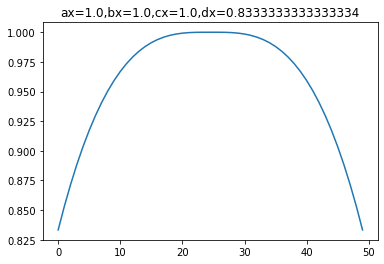

1.0 1.0 1.0 0.6666666666666667 1


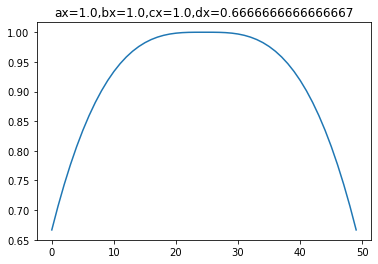

1.0 1.0 1.0 0.5 2


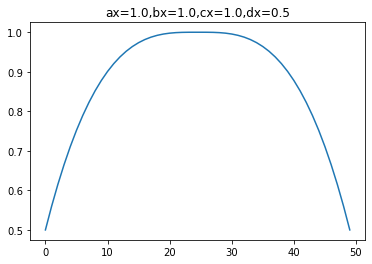

1.0 1.0 0.8333333333333334 0.6666666666666667 3


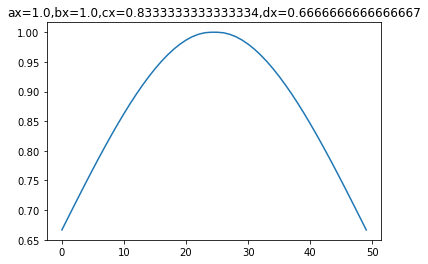

1.0 1.0 0.8333333333333334 0.5 4


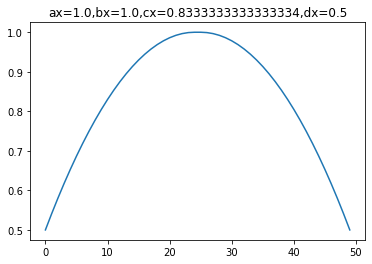

1.0 1.0 0.6666666666666667 0.5 5


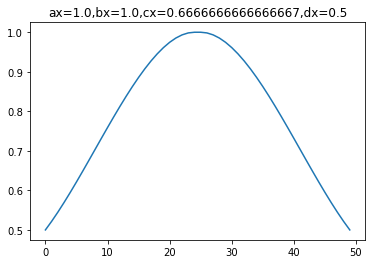

1.0 0.8333333333333334 0.8333333333333334 0.6666666666666667 6


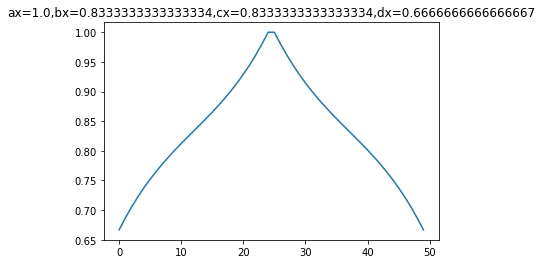

1.0 0.8333333333333334 0.8333333333333334 0.5 7


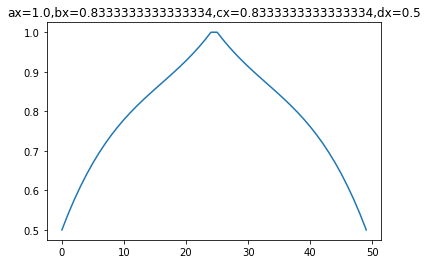

1.0 0.8333333333333334 0.6666666666666667 0.5 8


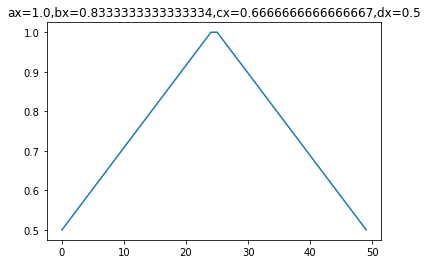

1.0 0.6666666666666667 0.6666666666666667 0.5 9


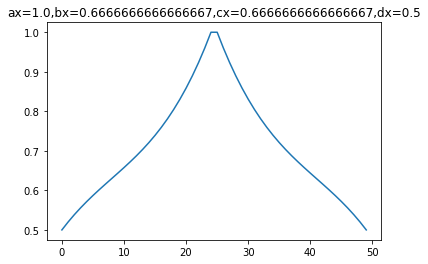

0.8333333333333334 0.8333333333333334 0.8333333333333334 0.6666666666666667 10


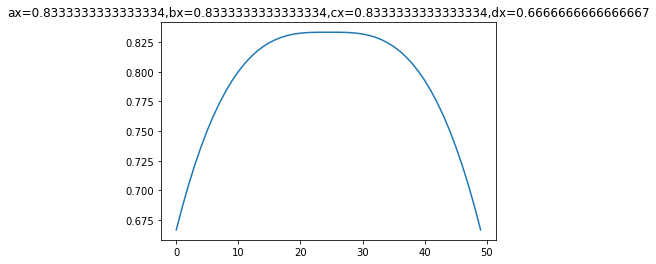

0.8333333333333334 0.8333333333333334 0.8333333333333334 0.5 11


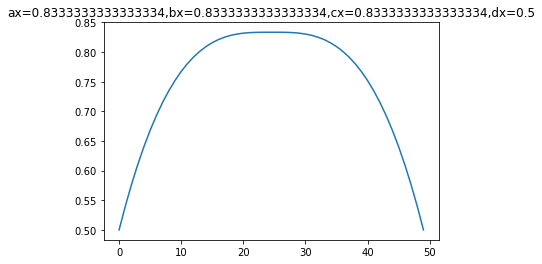

0.8333333333333334 0.8333333333333334 0.6666666666666667 0.5 12


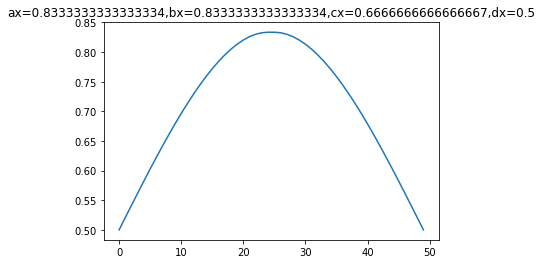

0.8333333333333334 0.6666666666666667 0.6666666666666667 0.5 13


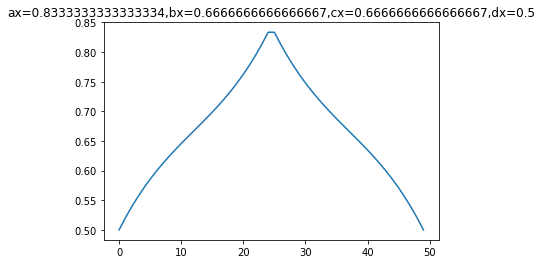

0.6666666666666667 0.6666666666666667 0.6666666666666667 0.5 14


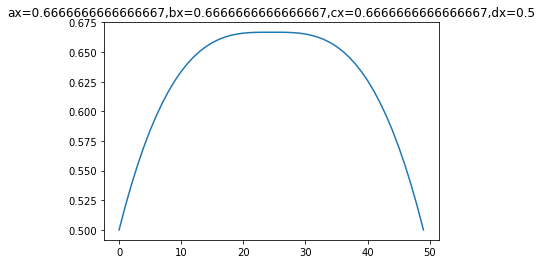

In [83]:
# Bezier curve
# https://orion.math.iastate.edu/dept/thesisarchive/MSCC/HarwoodMSMS09.pdf
import numpy as np
import matplotlib.pyplot as plt
number_of_bins=50
range_params=np.linspace(1,0.5,4)
print(range_params)


counter=0

list_figs=[]
for ax in range_params:
    for bx in range_params:
        for cx in range_params:
            for dx in range_params:
                if ax>=bx>=cx>dx:
                    print(ax,bx,cx,dx,counter)                    
                    x=np.linspace(1,0,number_of_bins//2)
                    y1=ax*(1-x)**3 + bx*3*x*(1-x)**2 + cx*3*(x**2)*(1-x) + dx*(x**3)

                    x=np.linspace(0,1,number_of_bins//2)
                    y2=ax*(1-x)**3 + bx*3*x*(1-x)**2 + cx*3*(x**2)*(1-x) + dx*(x**3)


                    y=np.concatenate((y1,y2))
                    list_figs.append(y)
                    plt.plot(y)
                    plt.title('ax='+str(ax)+",bx="+str(bx)+",cx="+str(cx)+",dx="+str(dx))
#                     plt.legend()    
                    plt.show()  
                    counter+=1

In [84]:
permissible=[0,3,6,9]
permissible_list_figs=[]
for i in range(len(list_figs)):
    if i in permissible:
        y=list_figs[i]
        permissible_list_figs.append(y)

In [85]:
len(permissible_list_figs)

4

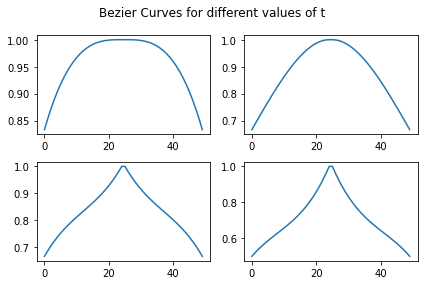

In [86]:
fig, axs = plt.subplots(2,2)

fig.suptitle('Bezier Curves for different values of t')

rows=2
cols=2
for i in range(rows):
    for j in range(cols):
        index=i*cols+j
        axs[i][j].plot(permissible_list_figs[index])
        
fig.tight_layout()
fig.savefig("images/beziers.svg")
fig.show()

        

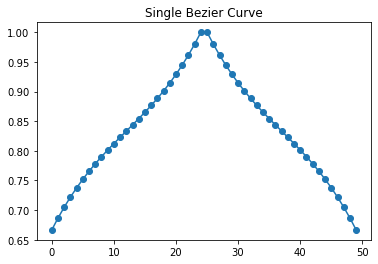

In [87]:
# Single Bezier Curve

plt.plot(permissible_list_figs[2],marker='o')
        
plt.savefig("images/single_bezier.svg")
plt.title("Single Bezier Curve")
plt.show()

        


In [88]:
print("Hello")

Hello


[1.         0.83333333 0.66666667 0.5       ]
1.0 1.0 1.0 0.8333333333333334 0


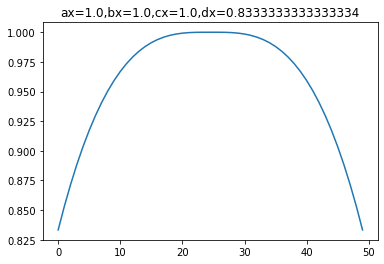

1.0 1.0 1.0 0.6666666666666667 1


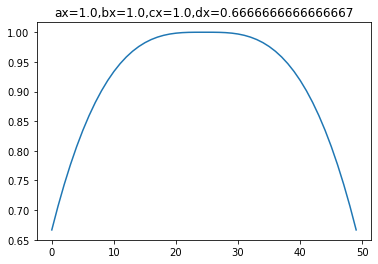

1.0 1.0 1.0 0.5 2


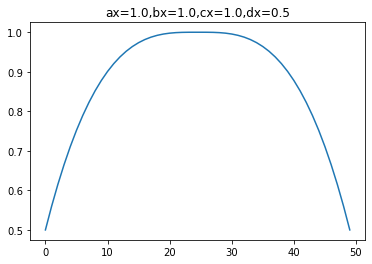

1.0 1.0 0.8333333333333334 0.6666666666666667 3


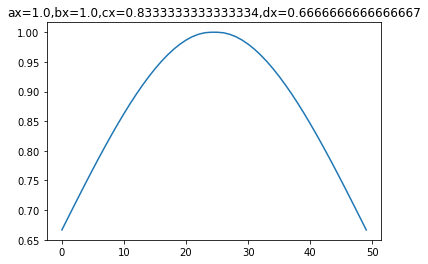

1.0 1.0 0.8333333333333334 0.5 4


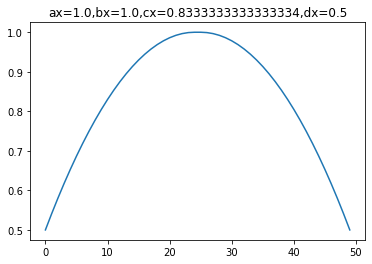

1.0 1.0 0.6666666666666667 0.5 5


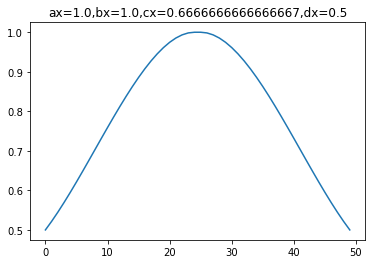

1.0 0.8333333333333334 0.8333333333333334 0.6666666666666667 6


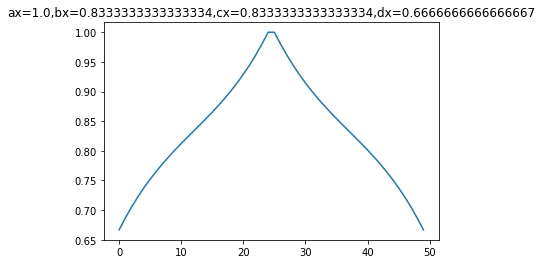

1.0 0.8333333333333334 0.8333333333333334 0.5 7


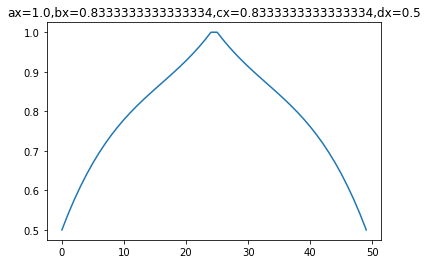

1.0 0.8333333333333334 0.6666666666666667 0.5 8


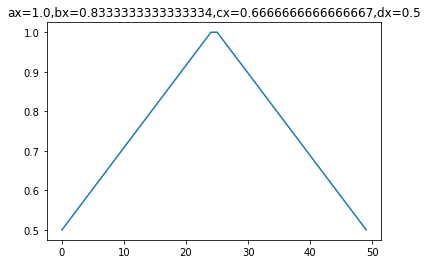

1.0 0.6666666666666667 0.6666666666666667 0.5 9


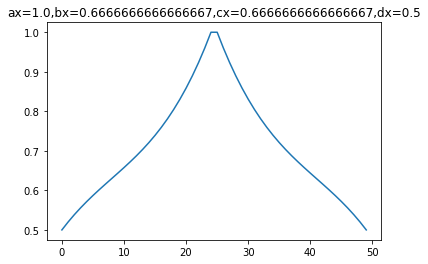

0.8333333333333334 0.8333333333333334 0.8333333333333334 0.6666666666666667 10


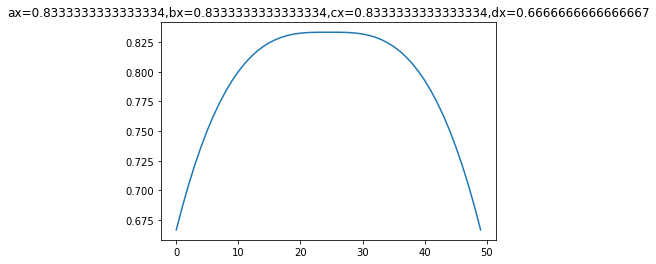

0.8333333333333334 0.8333333333333334 0.8333333333333334 0.5 11


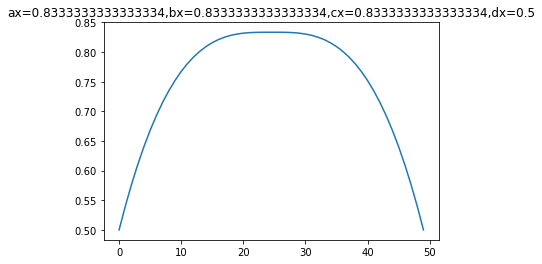

0.8333333333333334 0.8333333333333334 0.6666666666666667 0.5 12


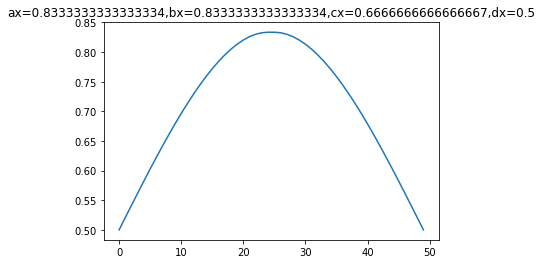

0.8333333333333334 0.6666666666666667 0.6666666666666667 0.5 13


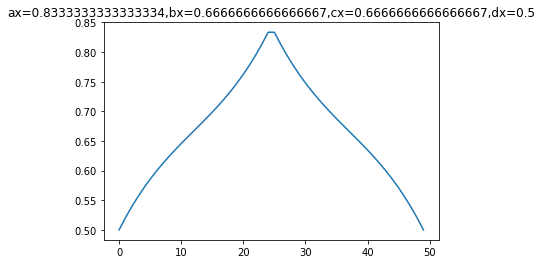

0.6666666666666667 0.6666666666666667 0.6666666666666667 0.5 14


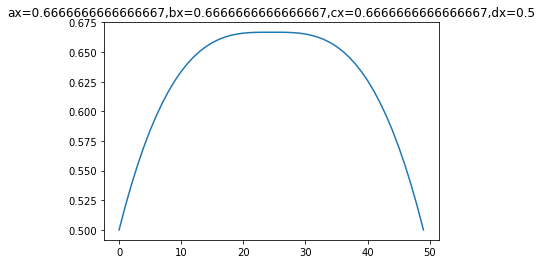

In [89]:
# Bezier curve
# https://orion.math.iastate.edu/dept/thesisarchive/MSCC/HarwoodMSMS09.pdf
import numpy as np
import matplotlib.pyplot as plt
number_of_bins=50
range_params=np.linspace(1,0.5,4)
print(range_params)


counter=0

list_figs=[]
for ax in range_params:
    for bx in range_params:
        for cx in range_params:
            for dx in range_params:
                if ax>=bx>=cx>dx:
                    print(ax,bx,cx,dx,counter)                    
                    x=np.linspace(1,0,number_of_bins//2)
                    y1=ax*(1-x)**3 + bx*3*x*(1-x)**2 + cx*3*(x**2)*(1-x) + dx*(x**3)

                    x=np.linspace(0,1,number_of_bins//2)
                    y2=ax*(1-x)**3 + bx*3*x*(1-x)**2 + cx*3*(x**2)*(1-x) + dx*(x**3)


                    y=np.concatenate((y1,y2))
                    list_figs.append(y)
                    plt.plot(y)
                    plt.title('ax='+str(ax)+",bx="+str(bx)+",cx="+str(cx)+",dx="+str(dx))
#                     plt.legend()    
                    plt.show()  
                    counter+=1

fc1.weight torch.Size([256, 784])


[2.95159386e-03 5.90318772e-04 2.36127509e-03 5.90318772e-04
 1.77095632e-03 1.77095632e-03 4.72255018e-03 8.26446281e-03
 5.90318772e-03 1.47579693e-02 2.12514758e-02 3.01062574e-02
 5.43093270e-02 6.84769776e-02 1.21605667e-01 2.26682409e-01
 6.30460449e-01 8.22904368e-01 8.77804014e-01 9.20306966e-01
 9.16174734e-01 9.56316411e-01 1.00000000e+00 9.49822904e-01
 9.80519481e-01 9.97638725e-01 9.43329398e-01 9.06139315e-01
 8.27036600e-01 7.57378985e-01 3.29988194e-01 1.75324675e-01
 1.28689492e-01 7.49704841e-02 4.66351830e-02 2.83353011e-02
 1.77095632e-02 1.06257379e-02 6.49350649e-03 4.13223140e-03
 3.54191263e-03 1.77095632e-03 5.90318772e-04 0.00000000e+00
 5.90318772e-04 1.18063754e-03 0.00000000e+00 1.18063754e-03
 0.00000000e+00 5.90318772e-04] [-0.11789446 -0.11278062 -0.10766679 -0.10255296 -0.09743913 -0.09232529
 -0.08721145 -0.08209762 -0.07698379 -0.07186995 -0.06675612 -0.06164229
 -0.05652845 -0.05141462 -0.04630079 -0.04118695 -0.03607312 -0.03095929
 -0.02584545 -0.0

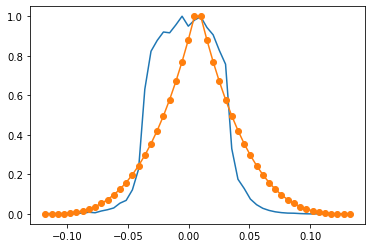

In [90]:
if torch.cuda.is_available():
    model.load_state_dict(torch.load(model_state_path))
else:
    model.load_state_dict(torch.load(model_state_path,map_location=torch.device('cpu')))


for nm, params in model.named_parameters():
    if "weight" in nm and "bn" not in nm and "linear" not in nm:
        print(nm,params.data.shape)
        xs=torch.flatten(params.data[:30])
        fig=px.histogram(xs,nbins=50,  width=500, height=400)        
        fig.show()
        
        
        
        hist, bin_edges = np.histogram(xs,bins=50)
        hist=(hist-np.min(hist))/(np.max(hist)-np.min(hist))
        print(hist,bin_edges)
        
        plt.plot(bin_edges[:-1],hist)
        
        
        ax=1
        bx=0.8
        cx=0.8
        dx=0.8
        number_of_bins=50
        x=np.linspace(1,0,number_of_bins//2)
        y1=ax*(1-x)**3 + bx*3*x*(1-x)**2 + cx*3*(x**2)*(1-x) + dx*(x**3)

        x=np.linspace(0,1,number_of_bins//2)
        y2=ax*(1-x)**3 + bx*3*x*(1-x)**2 + cx*3*(x**2)*(1-x) + dx*(x**3)


        bez_vals=np.concatenate((y1,y2))
        bez_vals=(bez_vals-np.min(bez_vals))/(np.max(bez_vals)-np.min(bez_vals))
        plt.plot(bin_edges[:-1],bez_vals,marker='o')
        plt.savefig("images/bezOnWeights.svg")
        plt.savefig("images/bezOnWeights.png")
        plt.show()
        break

fc1.weight torch.Size([256, 784])


[2.95159386e-03 5.90318772e-04 2.36127509e-03 5.90318772e-04
 1.77095632e-03 1.77095632e-03 4.72255018e-03 8.26446281e-03
 5.90318772e-03 1.47579693e-02 2.12514758e-02 3.01062574e-02
 5.43093270e-02 6.84769776e-02 1.21605667e-01 2.26682409e-01
 6.30460449e-01 8.22904368e-01 8.77804014e-01 9.20306966e-01
 9.16174734e-01 9.56316411e-01 1.00000000e+00 9.49822904e-01
 9.80519481e-01 9.97638725e-01 9.43329398e-01 9.06139315e-01
 8.27036600e-01 7.57378985e-01 3.29988194e-01 1.75324675e-01
 1.28689492e-01 7.49704841e-02 4.66351830e-02 2.83353011e-02
 1.77095632e-02 1.06257379e-02 6.49350649e-03 4.13223140e-03
 3.54191263e-03 1.77095632e-03 5.90318772e-04 0.00000000e+00
 5.90318772e-04 1.18063754e-03 0.00000000e+00 1.18063754e-03
 0.00000000e+00 5.90318772e-04] [-0.11789446 -0.11278062 -0.10766679 -0.10255296 -0.09743913 -0.09232529
 -0.08721145 -0.08209762 -0.07698379 -0.07186995 -0.06675612 -0.06164229
 -0.05652845 -0.05141462 -0.04630079 -0.04118695 -0.03607312 -0.03095929
 -0.02584545 -0.0

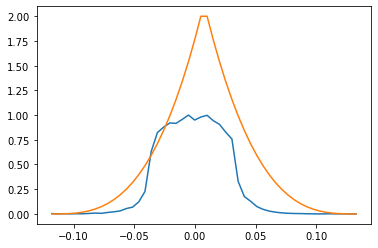

In [91]:
if torch.cuda.is_available():
    model.load_state_dict(torch.load(model_state_path))
else:
    model.load_state_dict(torch.load(model_state_path,map_location=torch.device('cpu')))

    

for nm, params in model.named_parameters():
    if "weight" in nm and "bn" not in nm and "linear" not in nm:
        print(nm,params.data.shape)
        xs=torch.flatten(params.data[:30])
        fig=px.histogram(xs, nbins=50, width=500, height=400)        
        fig.show()
        
        
        
        hist, bin_edges = np.histogram(xs,bins=50)
        hist=(hist-np.min(hist))/(np.max(hist)-np.min(hist))
        print(hist,bin_edges)
        
        plt.plot(bin_edges[:-1],hist)
        
        
        ax=1
        bx=0.8
        cx=0.8
        dx=0.8
        number_of_bins=50
        upscale=2
        x=np.linspace(1,0,number_of_bins//2)
        y1=ax*(1-x)**3 + bx*3*x*(1-x)**2 + cx*3*(x**2)*(1-x) + dx*(x**3)

        x=np.linspace(0,1,number_of_bins//2)
        y2=ax*(1-x)**3 + bx*3*x*(1-x)**2 + cx*3*(x**2)*(1-x) + dx*(x**3)


        bez_vals=np.concatenate((y1,y2))
        bez_vals=(bez_vals-np.min(bez_vals))/(np.max(bez_vals)-np.min(bez_vals))*upscale
        plt.plot(bin_edges[:-1],bez_vals)
        plt.savefig("images/bezOnWeightsUpscaled.svg")
        plt.savefig("images/bezOnWeightsUpscaled.png")
        plt.show()
        break

### Pruning the bezier way

In [92]:
def find_wt_indices(x,start,end):
#     print("FInding index")
    sel_indices=[]
    for i in range(len(x)):
#         print(x[i])
        if x[i]>=start and x[i]<=end:
            sel_indices.append(i)
    return sel_indices
def prune_array_bezier(xs,hist,bin_edges,bez_proportions):
    for i in range(len(bin_edges)-1):
        start=bin_edges[i]
        end=bin_edges[i+1]

        count_wts_to_kill=int(hist[i]*bez_proportions[i])

        if count_wts_to_kill>0:
#             print("start",start,"end",end)                    
#             print("to kill",count_wts_to_kill)        
            list_wt_indices=find_wt_indices(xs,start,end)

            selected_indices_prune=random.sample(list_wt_indices,count_wts_to_kill)
#             print("To kill ",len(selected_indices_prune),"indinces")            
            for indx in selected_indices_prune:
                xs[indx]=0            
    return xs
    

In [93]:
if torch.cuda.is_available():
    model.load_state_dict(torch.load(model_state_path))
else:
    model.load_state_dict(torch.load(model_state_path,map_location=torch.device('cpu')))

    
for nm, params in model.named_parameters():
    if "weight" in nm and "bn" not in nm and "linear" not in nm:
        print(nm,params.data.shape)
        xs=torch.flatten(params.data[:30])
        print(torch.min(xs),torch.max(xs))
        
        
        
        # generate bezier
        ax=1
        bx=0.8
        cx=0.8
        dx=0.8
        number_of_bins=50
        x=np.linspace(1,0,number_of_bins//2)
        y1=ax*(1-x)**3 + bx*3*x*(1-x)**2 + cx*3*(x**2)*(1-x) + dx*(x**3)

        x=np.linspace(0,1,number_of_bins//2)
        y2=ax*(1-x)**3 + bx*3*x*(1-x)**2 + cx*3*(x**2)*(1-x) + dx*(x**3)
        bez_vals=np.concatenate((y1,y2))
        bez_vals=(bez_vals-np.min(bez_vals))/(np.max(bez_vals)-np.min(bez_vals))
        
        # let us prune
        hist, bin_edges = np.histogram(xs,bins=50)
        xs=prune_array_bezier(xs,hist,bin_edges,bez_vals)
        thres=0
        xs=prune_array(xs,thres)
        print(xs.shape)
        fig=px.histogram(xs, nbins=50, width=500, height=350)
        fig.update(layout_showlegend=False)
        fig.update_layout(
#         title="Histogram of weight magnitudes for neurons of a layer of a neural network",
        xaxis_title="",
        yaxis_title="",
    #     font=dict(
    #         family="Courier New, monospace",
    #         size=18,
    #         color="RebeccaPurple"
    #     )
    )

        fig.show()
        fig.write_image("images/mnistL1N30Pruned_bezier.svg")
        break



fc1.weight torch.Size([256, 784])
tensor(-0.1179) tensor(0.1378)
(9340,)


### Can we do such plot on matplotlib

Show the overlap and the resulting histogram side by side


Bez 0
fc1.weight torch.Size([256, 784])
tensor(-0.1179) tensor(0.1378)


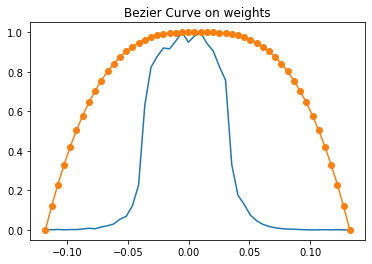

(1687,)


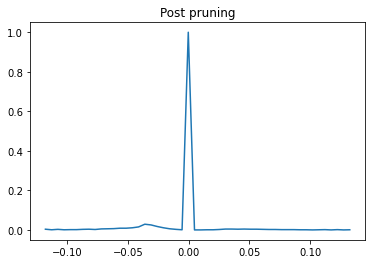

Bez 1
fc1.weight torch.Size([256, 784])
tensor(-0.1179) tensor(0.1378)


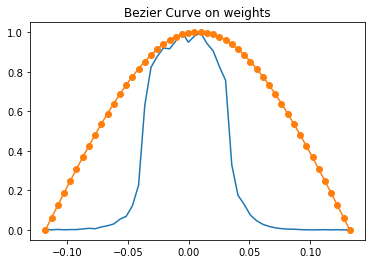

(2586,)


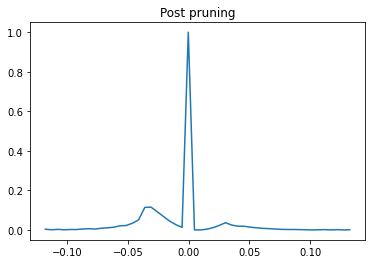

Bez 2
fc1.weight torch.Size([256, 784])
tensor(-0.1179) tensor(0.1378)


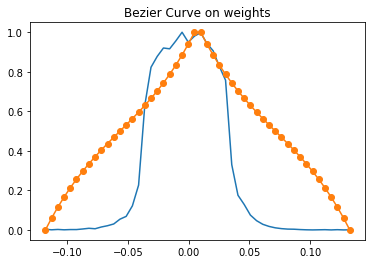

(5548,)


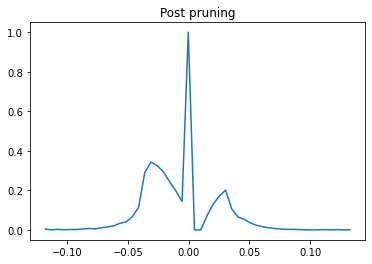

Bez 3
fc1.weight torch.Size([256, 784])
tensor(-0.1179) tensor(0.1378)


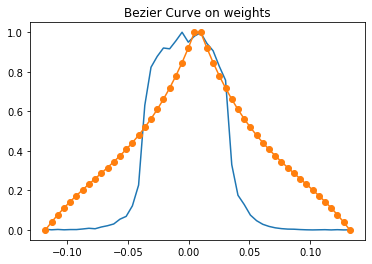

(6837,)


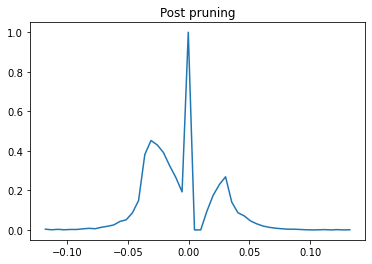

In [94]:

for nm, params in model.named_parameters():
    if "weight" in nm and "bn" not in nm and "linear" not in nm:
        for bez_index in range(len(permissible_list_figs)):
            
            
            if torch.cuda.is_available():
                model.load_state_dict(torch.load(model_state_path))
            else:
                model.load_state_dict(torch.load(model_state_path,map_location=torch.device('cpu')))

            
            print("Bez",bez_index)
            
            print(nm,params.data.shape)
            xs=torch.flatten(params.data[:30])
            print(torch.min(xs),torch.max(xs))

            hist, bin_edges = np.histogram(xs,bins=50)
            hist=(hist-np.min(hist))/(np.max(hist)-np.min(hist))
    #         print(hist,bin_edges)

            plt.plot(bin_edges[:-1],hist)
            plt.title("Bezier Curve on weights")



            # generate bezier
    #         ax=1
    #         bx=0.8
    #         cx=0.8
    #         dx=0.8
    #         number_of_bins=50
    #         x=np.linspace(1,0,number_of_bins//2)
    #         y1=ax*(1-x)**3 + bx*3*x*(1-x)**2 + cx*3*(x**2)*(1-x) + dx*(x**3)

    #         x=np.linspace(0,1,number_of_bins//2)
    #         y2=ax*(1-x)**3 + bx*3*x*(1-x)**2 + cx*3*(x**2)*(1-x) + dx*(x**3)
    #         bez_vals=np.concatenate((y1,y2))
            bez_vals=permissible_list_figs[bez_index]
            bez_vals=(bez_vals-np.min(bez_vals))/(np.max(bez_vals)-np.min(bez_vals))


            plt.plot(bin_edges[:-1],bez_vals,marker='o')
            plt.show()

            # let us prune
            hist, bin_edges = np.histogram(xs,bins=50)
            xs=prune_array_bezier(xs,hist,bin_edges,bez_vals)
            thres=0
            xs=prune_array(xs,thres)
            print(xs.shape)
            fig=px.histogram(xs, nbins=50,width=500, height=350)
            fig.update(layout_showlegend=False)
            fig.update_layout(
    #         title="Histogram of weight magnitudes for neurons of a layer of a neural network",
            xaxis_title="",
            yaxis_title="",
        #     font=dict(
        #         family="Courier New, monospace",
        #         size=18,
        #         color="RebeccaPurple"
        #     )
        )

            fig.show()
    #         fig.write_image("images/mnistL1N30Pruned_bezier.svg")
            hist, bin_edges = np.histogram(xs,bins=50)
            hist=(hist-np.min(hist))/(np.max(hist)-np.min(hist))


            plt.plot(bin_edges[:-1],hist)
            plt.title("Post pruning")        
            plt.show()
        
        break



In [95]:
permissible_list_figs

[array([0.83333333, 0.85331067, 0.87162423, 0.88834635, 0.90354938,
        0.91730565, 0.9296875 , 0.94076726, 0.95061728, 0.9593099 ,
        0.96691744, 0.97351225, 0.97916667, 0.98395303, 0.98794367,
        0.99121094, 0.99382716, 0.99586468, 0.99739583, 0.99849296,
        0.9992284 , 0.99967448, 0.99990355, 0.99998794, 1.        ,
        1.        , 0.99998794, 0.99990355, 0.99967448, 0.9992284 ,
        0.99849296, 0.99739583, 0.99586468, 0.99382716, 0.99121094,
        0.98794367, 0.98395303, 0.97916667, 0.97351225, 0.96691744,
        0.9593099 , 0.95061728, 0.94076726, 0.9296875 , 0.91730565,
        0.90354938, 0.88834635, 0.87162423, 0.85331067, 0.83333333]),
 array([0.66666667, 0.68748794, 0.70823688, 0.72884115, 0.7492284 ,
        0.76932629, 0.7890625 , 0.80836468, 0.82716049, 0.8453776 ,
        0.86294367, 0.87978636, 0.89583333, 0.91101225, 0.92525077,
        0.93847656, 0.95061728, 0.9616006 , 0.97135417, 0.97980565,
        0.98688272, 0.99251302, 0.99662423, 0.

In [96]:
len(permissible_list_figs)

4

In [107]:
ax,bx,cx,dx=[1, .02, .02, 0.01]
# ax,bx,cx,dx=[0.9995, 0.9995, 0.9995, 0.9994]
# ax,bx,cx,dx=[0.81, 0.81, 0.81, 0.71]
x=np.linspace(1,0,number_of_bins//2)
y1=ax*(1-x)**3 + bx*3*x*(1-x)**2 + cx*3*(x**2)*(1-x) + dx*(x**3)

x=np.linspace(0,1,number_of_bins//2)
y2=ax*(1-x)**3 + bx*3*x*(1-x)**2 + cx*3*(x**2)*(1-x) + dx*(x**3)


y=np.concatenate((y1,y2))
y=(y-np.min(y))/(np.max(y)-np.min(y))
# y+=0.19
proportion_compression=np.sum(y)/number_of_bins



print(ax,bx,cx,dx,number_of_bins,proportion_compression)                    
plt.plot(y)
plt.title('ax='+str(ax)+",bx="+str(bx)+",cx="+str(cx)+",dx="+str(dx))
plt.show()  


permissible_list_figs[-1]=y

Bez 0
fc1.weight torch.Size([256, 784])
tensor(-0.1179) tensor(0.1378)
(1722,)
Bez 1
fc1.weight torch.Size([256, 784])
tensor(-0.1179) tensor(0.1378)
(2573,)
Bez 2
fc1.weight torch.Size([256, 784])
tensor(-0.1179) tensor(0.1378)
(5571,)
Bez 3
fc1.weight torch.Size([256, 784])
tensor(-0.1179) tensor(0.1378)
(9292,)


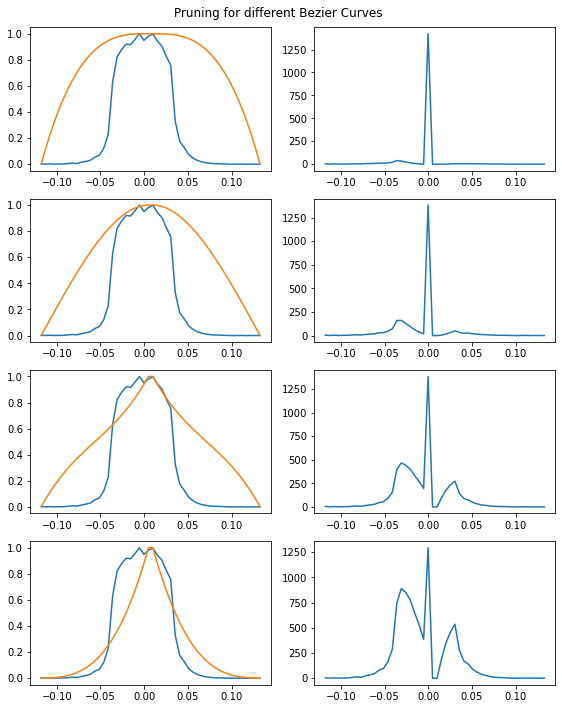

In [109]:
fig, axs = plt.subplots(4,2,figsize=(8,10))

fig.suptitle('Pruning for different Bezier Curves')

rows=4


row_num=0
for nm, params in model.named_parameters():
    if "weight" in nm and "bn" not in nm and "linear" not in nm:
        for bez_index in range(len(permissible_list_figs)):


            if torch.cuda.is_available():
                model.load_state_dict(torch.load(model_state_path))
            else:
                model.load_state_dict(torch.load(model_state_path,map_location=torch.device('cpu')))


            print("Bez",bez_index)

            print(nm,params.data.shape)
            xs=torch.flatten(params.data[:30])
            print(torch.min(xs),torch.max(xs))

            hist, bin_edges = np.histogram(xs,bins=50)
            hist=(hist-np.min(hist))/(np.max(hist)-np.min(hist))
    #         print(hist,bin_edges)

            axs[row_num][0].plot(bin_edges[:-1],hist)




            # generate bezier
    #         ax=1
    #         bx=0.8
    #         cx=0.8
    #         dx=0.8
    #         number_of_bins=50
    #         x=np.linspace(1,0,number_of_bins//2)
    #         y1=ax*(1-x)**3 + bx*3*x*(1-x)**2 + cx*3*(x**2)*(1-x) + dx*(x**3)

    #         x=np.linspace(0,1,number_of_bins//2)
    #         y2=ax*(1-x)**3 + bx*3*x*(1-x)**2 + cx*3*(x**2)*(1-x) + dx*(x**3)
    #         bez_vals=np.concatenate((y1,y2))
            bez_vals=permissible_list_figs[bez_index]
            bez_vals=(bez_vals-np.min(bez_vals))/(np.max(bez_vals)-np.min(bez_vals))


            axs[row_num][0].plot(bin_edges[:-1],bez_vals)


            # let us prune
            hist, bin_edges = np.histogram(xs,bins=50)
            xs=prune_array_bezier(xs,hist,bin_edges,bez_vals)
            thres=0
            xs=prune_array(xs,thres)
            print(xs.shape)
#             fig=px.histogram(xs,nbins=50, width=500, height=350)
#             fig.update(layout_showlegend=False)
#             fig.update_layout(
#     #         title="Histogram of weight magnitudes for neurons of a layer of a neural network",
#             xaxis_title="",
#             yaxis_title="",
#         #     font=dict(
#         #         family="Courier New, monospace",
#         #         size=18,
#         #         color="RebeccaPurple"
#         #     )
#         )

#             fig.show()
    #         fig.write_image("images/mnistL1N30Pruned_bezier.svg")
            hist, bin_edges = np.histogram(xs,bins=50)
#                 hist=(hist-np.min(hist))/(np.max(hist)-np.min(hist))


            axs[row_num][1].plot(bin_edges[:-1],hist)

            row_num+=1
        break
fig.tight_layout()
fig.savefig("images/diff_bez_onWts2.svg")
fig.savefig("images/diff_bez_onWts2.png")
fig.show()

In [ ]:
bez_vals

### Calculate area under the curve

In [27]:
# Bezier curve
# https://orion.math.iastate.edu/dept/thesisarchive/MSCC/HarwoodMSMS09.pdf
import numpy as np
import matplotlib.pyplot as plt
number_of_bins_range=[784,256,128,64]
range_params=np.linspace(1,0.9,5)
print(range_params)

good_params_dic={}
good_params_dic["ax"]=[]
good_params_dic["bx"]=[]
good_params_dic["cx"]=[]
good_params_dic["dx"]=[]
good_params_dic["number_of_bins"]=[]
good_params_dic["proportion_compression"]=[]



counter=0

list_figs=[]
for ax in range_params:
    print("ax=",ax)
    for bx in range_params:
        for cx in range_params:
            for dx in range_params:
                if cx>dx:
                    for number_of_bins in number_of_bins_range:
                        x=np.linspace(1,0,number_of_bins//2)
                        y1=ax*(1-x)**3 + bx*3*x*(1-x)**2 + cx*3*(x**2)*(1-x) + dx*(x**3)

                        x=np.linspace(0,1,number_of_bins//2)
                        y2=ax*(1-x)**3 + bx*3*x*(1-x)**2 + cx*3*(x**2)*(1-x) + dx*(x**3)


                        y=np.concatenate((y1,y2))
                        y=(y-np.min(y))/(np.max(y)-np.min(y))
                        proportion_compression=np.sum(y)/number_of_bins
                        list_figs.append(y)
#                         if proportion_compression>0.95:
#                             print(ax,bx,cx,dx,number_of_bins,proportion_compression)                    
    #                         plt.plot(y)
    #                         plt.title('ax='+str(ax)+",bx="+str(bx)+",cx="+str(cx)+",dx="+str(dx))
    #                         plt.show()  
                        good_params_dic["ax"].append(ax)
                        good_params_dic["bx"].append(bx)
                        good_params_dic["cx"].append(cx)
                        good_params_dic["dx"].append(dx)
                        good_params_dic["number_of_bins"].append(number_of_bins)
                        good_params_dic["proportion_compression"].append(proportion_compression)
                        


[1.    0.975 0.95  0.925 0.9  ]
ax= 1.0
ax= 0.975
ax= 0.95
ax= 0.925
ax= 0.9


In [28]:
# good_params_dic

In [29]:
df=pd.DataFrame(good_params_dic)

In [30]:
df=df.sort_values(["proportion_compression"])

In [31]:
df

,ax,bx,cx,dx,number_of_bins,proportion_compression
176,1.000,0.900,0.975,0.950,784,0.187595
177,1.000,0.900,0.975,0.950,256,0.189450
178,1.000,0.900,0.975,0.950,128,0.192186
179,1.000,0.900,0.975,0.950,64,0.197467
588,0.950,0.900,0.950,0.925,784,0.250639
...,...,...,...,...,...,...
534,0.950,0.925,1.000,0.900,128,0.807814
504,0.950,0.950,0.975,0.900,784,0.809298
248,0.975,0.975,1.000,0.925,784,0.809298
533,0.950,0.925,1.000,0.900,256,0.810550


1 0.02 0.02 0.01 50 0.265256734006734


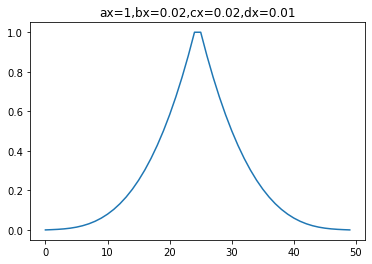

In [104]:
ax,bx,cx,dx=[1, .02, .02, 0.01]
# ax,bx,cx,dx=[0.9995, 0.9995, 0.9995, 0.9994]
# ax,bx,cx,dx=[0.81, 0.81, 0.81, 0.71]
x=np.linspace(1,0,number_of_bins//2)
y1=ax*(1-x)**3 + bx*3*x*(1-x)**2 + cx*3*(x**2)*(1-x) + dx*(x**3)

x=np.linspace(0,1,number_of_bins//2)
y2=ax*(1-x)**3 + bx*3*x*(1-x)**2 + cx*3*(x**2)*(1-x) + dx*(x**3)


y=np.concatenate((y1,y2))
y=(y-np.min(y))/(np.max(y)-np.min(y))
# y+=0.19
proportion_compression=np.sum(y)/number_of_bins



print(ax,bx,cx,dx,number_of_bins,proportion_compression)                    
plt.plot(y)
plt.title('ax='+str(ax)+",bx="+str(bx)+",cx="+str(cx)+",dx="+str(dx))
plt.show()  


In [106]:
y

array([0.        , 0.00128235, 0.00289352, 0.00526752, 0.00883838,
       0.01404014, 0.02130682, 0.03107244, 0.04377104, 0.05983665,
       0.07970328, 0.10380498, 0.13257576, 0.16644965, 0.20586069,
       0.2512429 , 0.3030303 , 0.36165693, 0.42755682, 0.50116398,
       0.58291246, 0.67323627, 0.77256944, 0.88134601, 1.        ,
       1.        , 0.88134601, 0.77256944, 0.67323627, 0.58291246,
       0.50116398, 0.42755682, 0.36165693, 0.3030303 , 0.2512429 ,
       0.20586069, 0.16644965, 0.13257576, 0.10380498, 0.07970328,
       0.05983665, 0.04377104, 0.03107244, 0.02130682, 0.01404014,
       0.00883838, 0.00526752, 0.00289352, 0.00128235, 0.        ])

In [104]:
# df.to_csv("results_sheet/bezr_props.csv",index=False)

In [105]:
df.shape

(1082900, 6)

In [99]:
a=np.array([
    [1,0,1,0],
    [1,1,1,0]
])

b=np.array([
    [1,1,0,1],
    [0,0,1,0]
])

c=np.multiply(a,b)

0.2 0.2 0.2 0.1


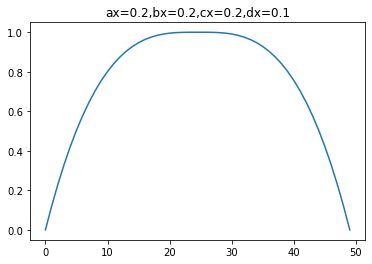

0.3 0.2 0.2 0.1


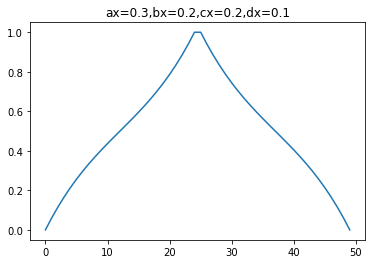

0.5 0.3 0.3 0.1


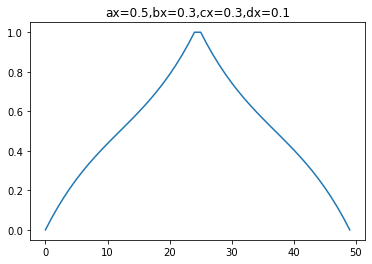

0.6 0.4 0.4 0.2


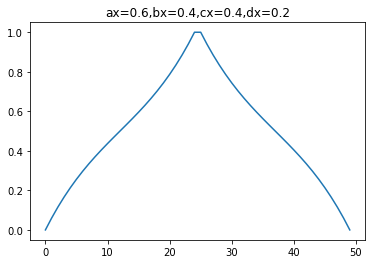

0.9 0.6 0.4 0.1


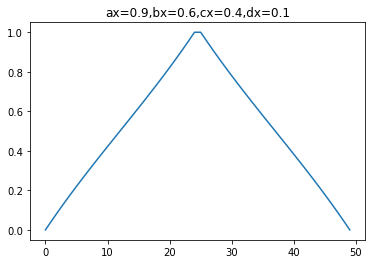

0.8 0.6 0.6 0.4


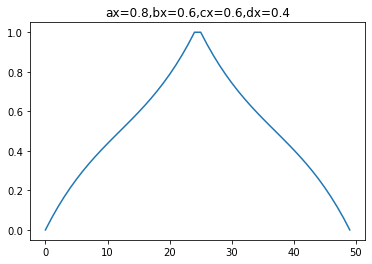

0.9 0.7 0.7 0.5


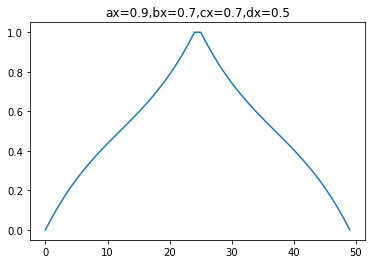

1 0.8 0.8 0.6


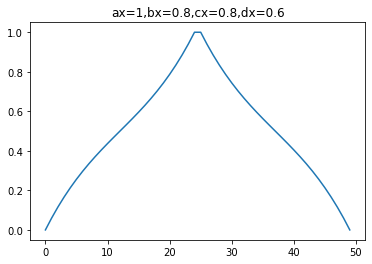

1 0.9 0.9 0.8


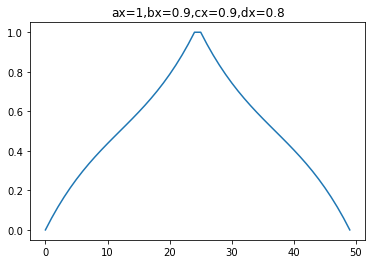

1 1 1 0.7


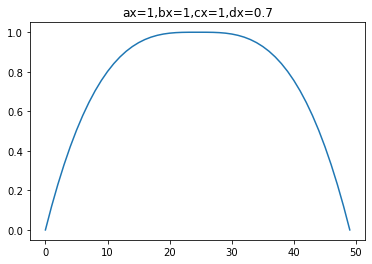

1 1 1 0.8


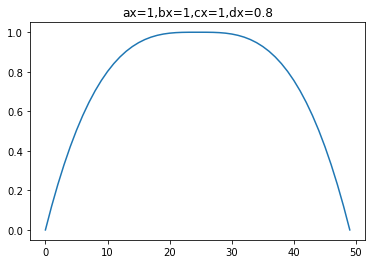

1 1 1 0.9


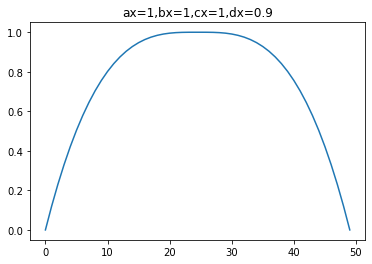

1 1 1 0.9


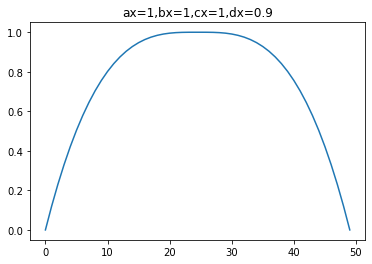

1 1 1 0.9


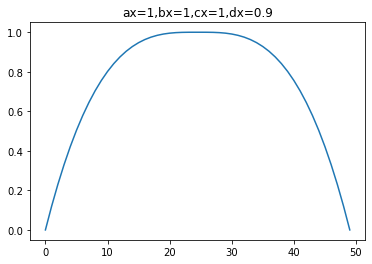

1 1 1 0.9


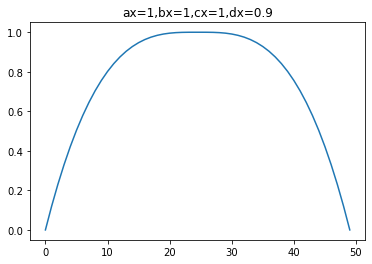

In [106]:
df_proportions=pd.read_csv("results_sheet/bezr_props.csv")

In [116]:
df_proportions[(df_proportions["proportion_compression"]>0.5) 
               & (df_proportions["proportion_compression"]<0.51)].head()


,ax,bx,cx,dx,number_of_bins,proportion_compression
517788,0.981633,0.908163,0.595918,0.522449,784,0.5
517789,0.816327,0.632653,0.614286,0.430612,784,0.5
517790,0.963265,0.724490,0.706122,0.467347,784,0.5
517791,0.926531,0.761224,0.706122,0.540816,784,0.5
517792,0.853061,0.797959,0.595918,0.540816,784,0.5
